In [ ]:
!git clone https://github.com/resemble-ai/Resemblyzer.git

In [1]:
from resemblyzer import VoiceEncoder
from demo_utils import *
from audio import preprocess_wav
from itertools import groupby
from pathlib import Path
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import wave
import sys
from resemblyzer.hparams import *


In [15]:
encoder = VoiceEncoder()

Loaded the voice encoder model on cpu in 0.01 seconds.


Preprocessing wavs:  22%|████████████▉                                               | 20/93 [00:12<03:17,  2.71s/wavs]C:\Users\hp\Untitled Folder\audio.py:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2, ax3) = plt.subplots(3,1)
Preprocessing wavs: 100%|██████████████████████████████████████████████████████████| 216/216 [00:21<00:00,  9.82wavs/s]


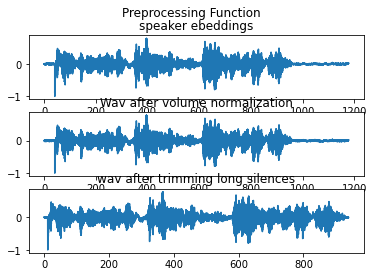

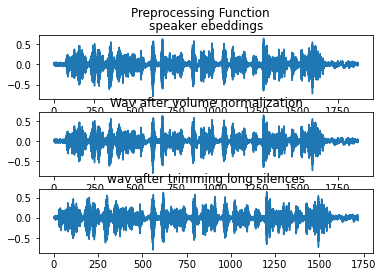

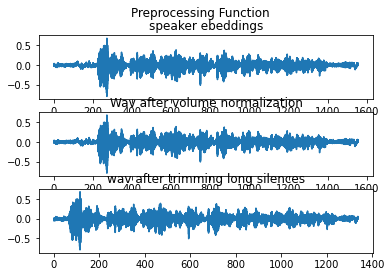

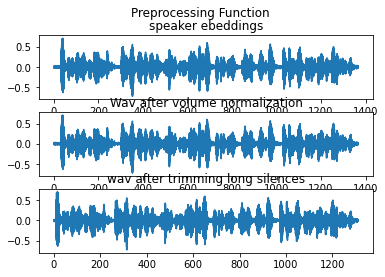

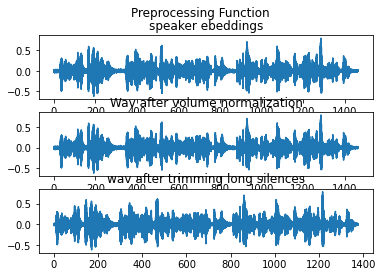

...

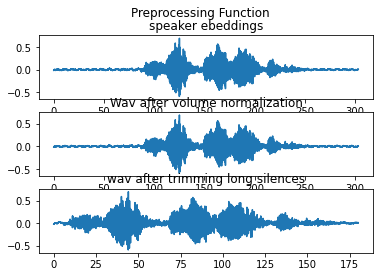

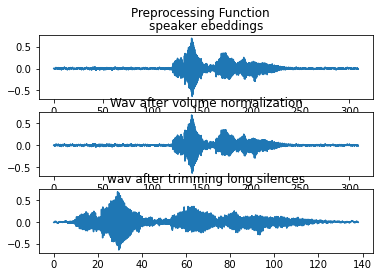

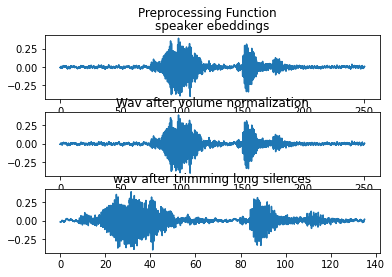

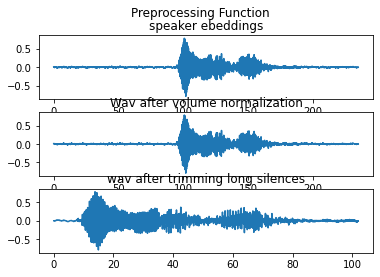

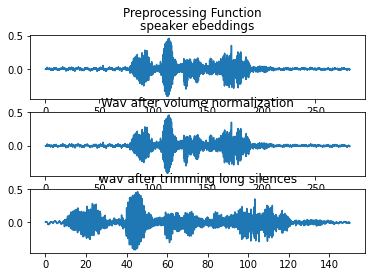

In [5]:
wav_fpaths = list(Path("D:/Resemblyzer/New folder/speech verification").glob("**/sentence_*.wav")) #Training data
wav_fpaths_test = list(Path("D:/Resemblyzer/New folder/speech verification").glob("**/short-*.wav")) #Test data

# Group the wavs per speaker and load them using the preprocessing function provided with 
# resemblyzer to load wavs in memory. It normalizes the volume, trims long silences and resamples 
# the wav to the correct sampling rate.
speaker_wavs = {speaker: list(map(preprocess_wav, wav_fpaths)) for speaker, wav_fpaths in
                groupby(tqdm(wav_fpaths, "Preprocessing wavs", len(wav_fpaths), unit="wavs"), 
                        lambda wav_fpath: wav_fpath.parent.stem)}

speaker_wavs_test = {speaker_test: list(map(preprocess_wav, wav_fpaths_test)) for speaker_test, wav_fpaths_test in
                groupby(tqdm(wav_fpaths_test, "Preprocessing wavs", len(wav_fpaths_test), unit="wavs"), 
                        lambda wav_fpath_test: wav_fpath_test.parent.stem)}


In [ ]:
print("Speaker wav files: ",speaker_wavs)
print("Test-Speaker wav files: ",speaker_wavs_test)

Speaker embeddings

In [16]:

spk_embeds_a = np.array([encoder.embed_speaker(wavs[:len(wavs)]) 
                         for wavs in speaker_wavs.values()])
spk_embeds_b = np.array([encoder.embed_speaker(wavs[:len(wavs)]) 
                         for wavs in speaker_wavs_test.values()])
spk_sim_matrix = np.inner(spk_embeds_a, spk_embeds_b)


In [24]:
speaker_names = []
for key in speaker_wavs.keys():
    speaker_names.append(key)
print(speaker_names)

['Alexa', 'Alina', 'Alon', 'Amihay', 'Anton', 'Asia', 'Aviv', 'Aviv_2', 'Ayelet', 'Dani', 'Daniel', 'Dima', 'Eldar', 'Eliran', 'Ido', 'Inara', 'Itay', 'Jesse', 'Liat', 'Matan', 'Mike', 'Ohad', 'Omer', 'Paul', 'Raz', 'Sagi', 'Shaked', 'Valeria', 'Vitaly', 'Yahel', 'Yaniv']


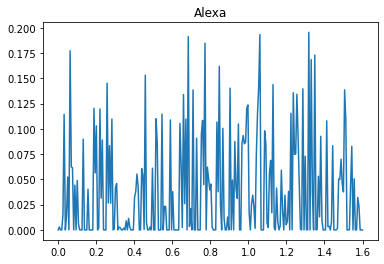

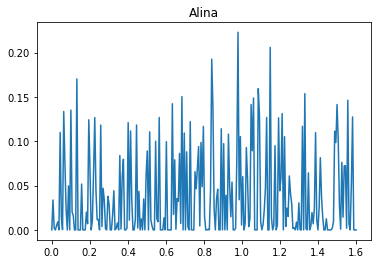

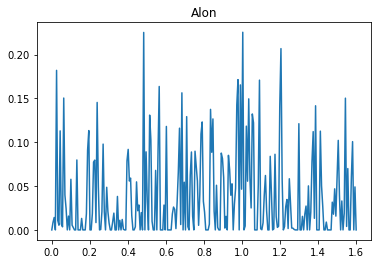

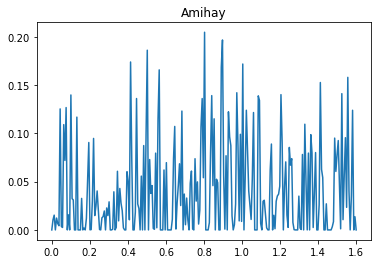

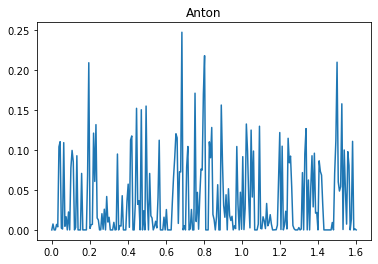

...

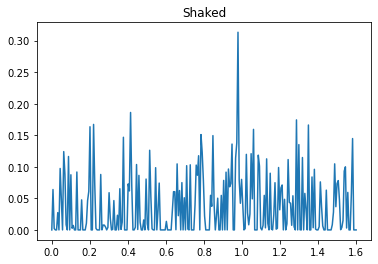

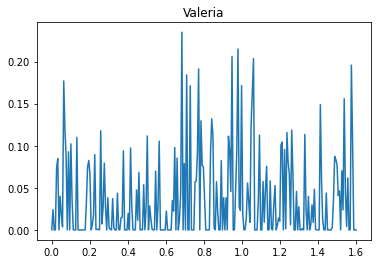

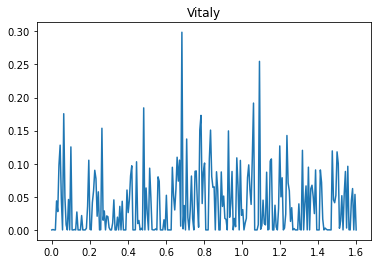

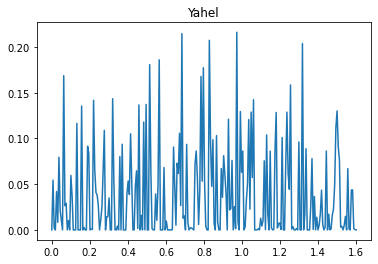

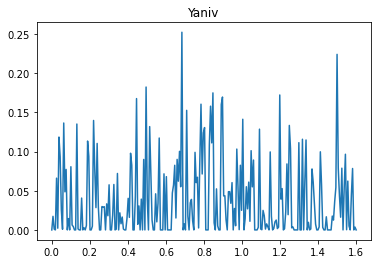

In [25]:
# Training Set Embeddings
for i in range(len(spk_embeds_a)):
    Time=np.linspace(0, len(spk_embeds_a[i])/partials_n_frames, num=len(spk_embeds_a[i]))
    plt.plot(Time,spk_embeds_a[i])
    plt.title(speaker_names[i])
    plt.show()

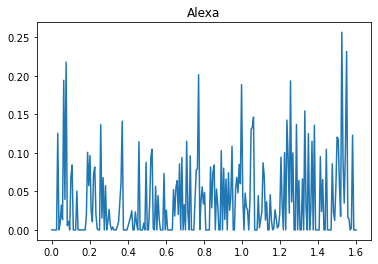

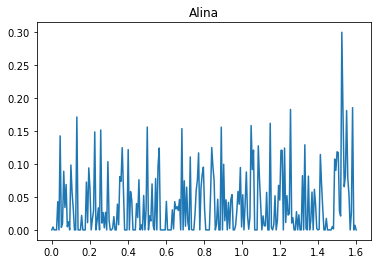

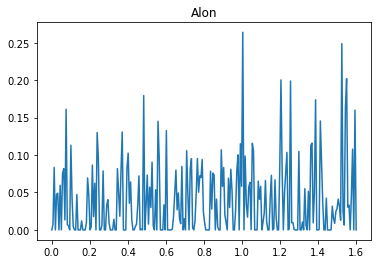

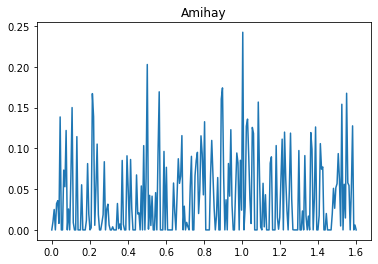

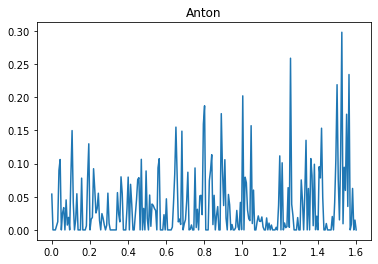

...

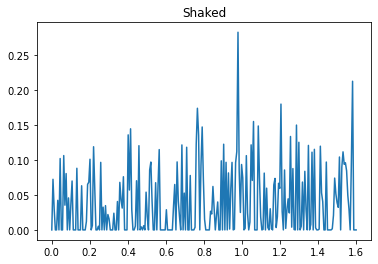

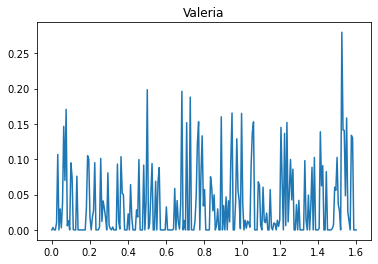

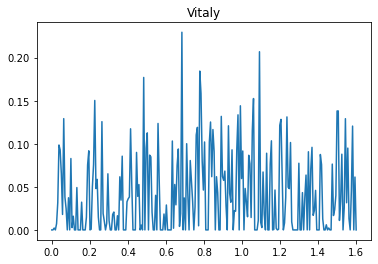

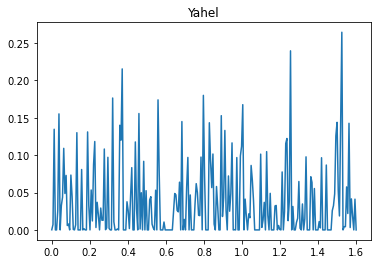

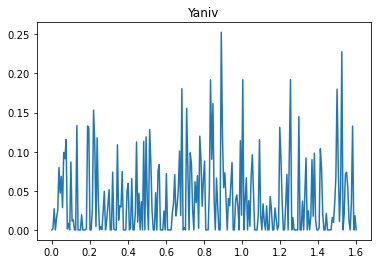

In [26]:
#Test set Embeddings
for i in range(len(spk_embeds_b)):
    Time=np.linspace(0, len(spk_embeds_b[i])/partials_n_frames, num=len(spk_embeds_b[i]))
    plt.plot(Time,spk_embeds_b[i])
    plt.title(speaker_names[i])
    plt.show()

In [14]:
print("speaker embeddings:\n",spk_embeds_a)

speaker embeddings:
 [[0.         0.00294797 0.         ... 0.         0.         0.        ]
 [0.         0.03375318 0.00194007 ... 0.         0.         0.        ]
 [0.         0.00847883 0.01416546 ... 0.         0.04905503 0.        ]
 ...
 [0.         0.0005564  0.         ... 0.         0.05364525 0.        ]
 [0.         0.05445076 0.00221338 ... 0.00183008 0.0002409  0.        ]
 [0.         0.01731601 0.00098871 ... 0.         0.00358602 0.        ]]


In [27]:
print("speaker embeddings Test:\n",spk_embeds_b)

speaker embeddings Test:
 [[0.0000000e+00 0.0000000e+00 3.8721828e-05 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 4.3817903e-03 0.0000000e+00 ... 0.0000000e+00
  7.0353029e-03 0.0000000e+00]
 [0.0000000e+00 7.3778350e-03 8.3505630e-02 ... 0.0000000e+00
  1.5998673e-01 0.0000000e+00]
 ...
 [0.0000000e+00 0.0000000e+00 2.1615068e-03 ... 0.0000000e+00
  6.1380681e-02 0.0000000e+00]
 [1.9793578e-04 7.2209062e-03 1.3466696e-01 ... 0.0000000e+00
  4.1162703e-02 0.0000000e+00]
 [0.0000000e+00 1.5640672e-03 2.7018199e-02 ... 0.0000000e+00
  1.8089019e-02 0.0000000e+00]]


In [28]:
print("Speaker Similarity Matrix\n",spk_sim_matrix)

Speaker Similarity Matrix
 [[0.79426897 0.63434047 0.51541984 0.54490525 0.43826404 0.5459375
  0.53524    0.6337514  0.5991721  0.45412177 0.44542435 0.48760793
  0.5673229  0.58797055 0.5494101  0.70676875 0.6332407  0.5506534
  0.6164224  0.44927797 0.58142406 0.5653598  0.5465156  0.49902216
  0.4782113  0.5609853  0.754598   0.6533992  0.6503713  0.53121334
  0.60715204]
 [0.6052859  0.8304483  0.5805195  0.6700729  0.5411691  0.68070966
  0.5789516  0.56196105 0.6662012  0.5560435  0.46769756 0.5331047
  0.6117551  0.63482744 0.628046   0.74089354 0.65627706 0.5491927
  0.64070195 0.49484286 0.61693996 0.620189   0.55897313 0.6419826
  0.57944375 0.6536364  0.7614165  0.65606445 0.72247463 0.53921247
  0.67040485]
 [0.52719766 0.6158285  0.7754237  0.7388024  0.50217545 0.55488896
  0.58027893 0.6425422  0.5435255  0.6266598  0.49395457 0.6000919
  0.7835692  0.7185196  0.6654188  0.6203866  0.73119783 0.568669
  0.5899863  0.53127897 0.6566582  0.59447235 0.7105259  0.6552136
  

C:\Users\hp\AppData\Local\Temp/ipykernel_11404/4258432172.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.eye(len(spk_sim_matrix), dtype=np.bool)


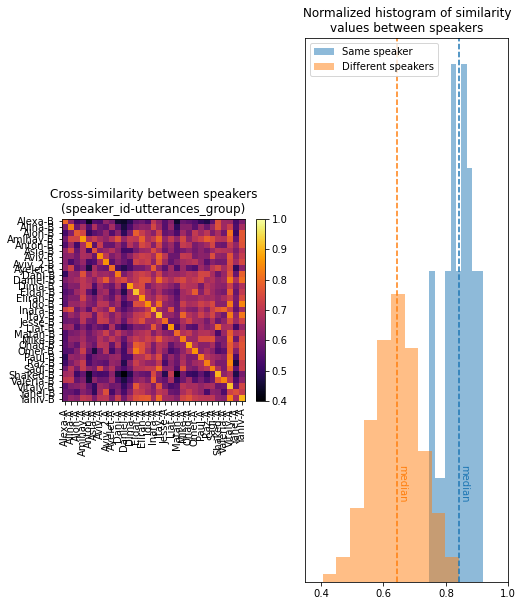

In [29]:
## Draw the plots
fix, axs = plt.subplots(1,2,figsize=(8, 10))
labels_a = ["%s-A" % i for i in speaker_wavs.keys()]
labels_b = ["%s-B" % i for i in speaker_wavs.keys()]
mask = np.eye(len(spk_sim_matrix), dtype=np.bool)
plot_similarity_matrix(spk_sim_matrix, labels_a, labels_b, axs[0], "Cross-similarity between speakers\n(speaker_id-utterances_group)")
plot_histograms((spk_sim_matrix[mask], spk_sim_matrix[np.logical_not(mask)]),axs[1],
                ["Same speaker", "Different speakers"], "Normalized histogram of similarity\nvalues between speakers")
plt.show()

Finding the highest similarity score

In [ ]:
similarity_max = np.amax(spk_sim_matrix,axis = 1)
print("speaker similtarity matrix Max column wise:\n", similarity_max)

In [ ]:
prediction = spk_sim_matrix.diagonal()
print(prediction)

In [ ]:
error = 0
diff = (prediction - similarity_max)
for element in diff:
    if element<0:
        error+=1
print("wrong predictions: ",error)
correct_pred = len(prediction)-error
print("correct predictions: ", correct_pred)
accuracy = correct_pred/(correct_pred+error)
print("Percentage of correct Predictions: ",accuracy)